In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import astropy.io.fits as fits

from JG_Streaktools import *

(-0.034169737, -0.16941732, 6.41911)

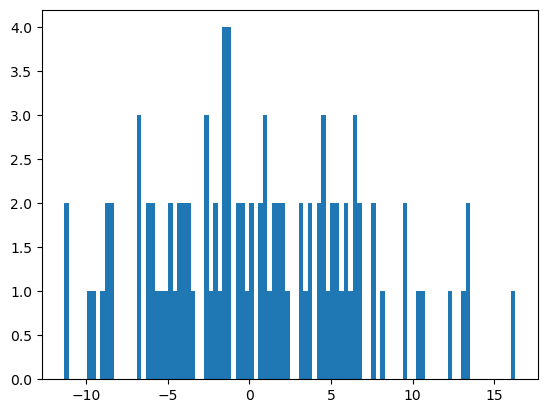

In [21]:
plt.hist(y[0],bins = 100)

stats.sigma_clipped_stats(y,sigma = 3)

# Starting a simulation

Alrighty! Here in the tutorial I'll show you how to use all of the stuff I've written into JG_Streaktools to add and remove
several simulated streaks in an image. We'll play with the parameters for each streak, and perform some pill aperture and PSF fitting
photometry.

To start simulating streaks, we need to initialize an instance of the main object I've written in Streaktools, which is a class called
streak_interface(). A class is sort of like a blueprint for a larger machine, which can have various functions and operations, called
methods, which it performs. If a truck is an instance of a class, which would be the design of the truck, then a method of this truck
would be something like starting the engine. You initialize an instance of the class simply by calling it. We can call this one of two
ways:

[1] If you have a fits file and possibly an extension, you can initialize streak_interface with two arguements. The first is the address of the .fits
file containing the field you want to simulate and measure streaks in, and the other is a number corresponding to the extension containing the data.
If no extension is passed, the .fits file is assumed not to be a MEF (so the 0th extension is used)

[2] If you load the (2D) data into a numpy array, then you can just pass that array directly to streak_interface as the only arguement. That data
will immediately be interpreted as the field you want to sim/measure in.

Let's take a look at both of these approaches:

In [2]:
## APPROACH 1 ##

f = fits.open('052244_OBJSUB.fits')
data = f[41].data

Tut_sim = streak_interface(data) ## Here we just enter the data in question as an arguement

## APPROACH 2 ##

Tut_sim = streak_interface('052244_OBJSUB.fits',41) ### Enter your choice of image and CCD, or a numpy array (in which case do not pass a number). 
                                                      #Use one of the 4 sky-subtracted processed images from Jan31
#                                 ^             ^
#                             directory     CCD number

Either of the above will provide exactly the same interface. There are a bunch of instance-wide parameters here which we can tweak. Most of them are initialized to some value, by default. We can check the current state of these parameters with a simple method call. The method we're going to call, which belongs to Tut_sim, is
print_properties() (does what it says on the tin):

In [3]:
Tut_sim.print_properties()

### INTERFACE PROPERTIES ###

Earth radius (R): 6371000.0m
Pixel scale (pixscale): 0.270asec/pixel
Flux zeropoint (Fzero): 3.727nW/m^2
Background 1sigma noise (im_noise): 6.40 counts
Image exposure time (exp_t): 30.0s
PSF 1sigma width (psf): 1.60 pixels
PSF FWHM (fwhm): 3.72 pixels
Image magnitude zeropoint (magzero): 28.88802
display vmax (VM): 30.0



Most of these are hopefully simple and self explanatory; I'll explain the ones which are more likely not to.

~ The flux zeropoint is the amount of power per unit area which corresponds to a magnitude (AB system) of exactly 0. This depends on band, and for us in DECam r-band it is
3.727nW/m^2. The flux zero point is the value $F_0$ which makes the equation

$m = -2.5 log_{10}(\frac{F}{F_0})$ 

true. Notice that this is an alternative to the idea of a magnitude zeropoint (can switch between the two using log
properties). This is a fixed property for the DECam r filter which I've gone to the trouble of calculating for you (involves
integrating over the DECam r band sensitivity).

~ The PSF 1sigma width is the sigma value corresponding in a Gaussian fit to the point spread function of the image. Basically,
this is how blurry sources are; larger values mean that point-sources like stars have their flux spread out to a wider area in the 
final image. For a streak, the streak gets wider (and slightly longer at the ends). As you'll see later, this .psf parameter can also contain
the full psf of the image as an array, in which case this 1sigma width will not appear in the printout.

~ The PSF FWHM ('Full Width at Half Maximum') is exactly what it says; the width of the point spread function profile, at the
distance from the centre where the profile is at half of its maximum. For a Gaussian, this is ALWAYS $2\sqrt{2\ln(2)} \sigma$
$\sim2.355\sigma$ where sigma is the 1sigma width, so make sure that if you change one of these values, you change the other
to match!

~ Finally, you've seen the magnitude zeropoint before. It's the knowledge of both the magnitude and flux zeropoint which allow us
to accurately convert the physical units of power per unit area to the arbitrary scale of 'counts' we have in the image. 28.88802
is the zeropoint I got for the first two exposures, so I've used it here for the simulation. Note that you can change this parameter,
it will just result in a corresponding change to the magnitude of the streak when we do pill aperture photometry later.

\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#\#

Updating parameters to new values is easy. For example, if I wanted to play god, I could update the radius of the earth (The calling names
of each parameter are listed next to the more readable names of the parameters above in the print_properties output):

In [4]:
Tut_sim.R = 6372e3 #muahahaha, add a km (BUT NOTICE THIS IS IN METERS!)

The radius of the earth in this sim is now a kilometre larger. All inputs to the simulation take SI units, even when print_properties
displays things in cgs or other units! This means always use metres for distances, seconds for time, Watts for power, etc. Let's just fix
the universe and check that the properties are as they started...

In [5]:
Tut_sim.R = 6371e3

Tut_sim.print_properties()

### INTERFACE PROPERTIES ###

Earth radius (R): 6371000.0m
Pixel scale (pixscale): 0.270asec/pixel
Flux zeropoint (Fzero): 3.727nW/m^2
Background 1sigma noise (im_noise): 6.40 counts
Image exposure time (exp_t): 30.0s
PSF 1sigma width (psf): 1.60 pixels
PSF FWHM (fwhm): 3.72 pixels
Image magnitude zeropoint (magzero): 28.88802
display vmax (VM): 30.0



Another simple thing we can do with the simulation instance alone is to display the current image, which may have new streaks in it. To display the current state of the simulation data, just use the display() method. This method shows the image with linear scaling, maxxed at pixel values of +VM and -VM (30 by default, can update this as the .VM property of the interface) so that faint structures appear:

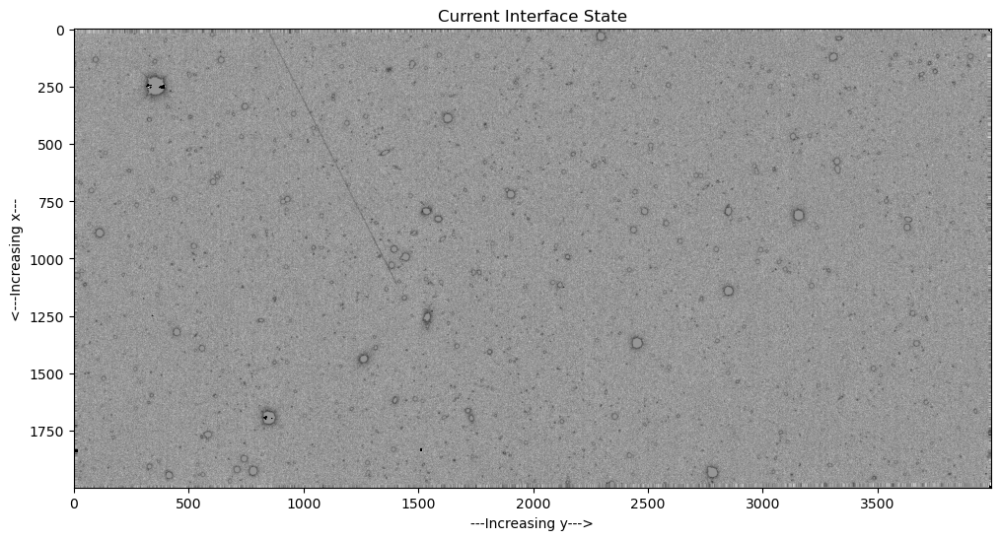

In [6]:
Tut_sim.VM = 20

Tut_sim.display()

# Adding streaks to the simulation

On its own, streak_interface is pretty useless. It's when we add streaks that we can do something useful. For this, there is also a class
called sim_streak(). The only calling parameter is the streak_interface instance you want to attach the streak to. For example, I'll create a
streak instance called streak1, and associate it with Tut_sim:

In [7]:
streak1 = sim_streak(Tut_sim)

As with the streak_interface class, there are a bunch of default values to even more parameters. The sim_streak() class also has a print_properties method to use, so let's check these new parameters:

In [8]:
streak1.print_properties()


Associated with interface:  <JG_Streaktools_Aug10.streak_interface object at 0x7f211b608340> 

### INTERFACE PROPERTIES ###

Earth radius (R): 6371000.0m
Pixel scale (pixscale): 0.270asec/pixel
Flux zeropoint (Fzero): 3.727nW/m^2
Background 1sigma noise (im_noise): 6.40 counts
Image exposure time (exp_t): 30.0s
PSF 1sigma width (psf): 1.60 pixels
PSF FWHM (fwhm): 3.72 pixels
Image magnitude zeropoint (magzero): 28.88802
display vmax (VM): 20.0

### STREAK SPECIFIC PROPERTIES ###

Is currently in interface image:  False
x1: (from top left, down) 100
y1: (from left to right) 100
Length (L): 500 pixels
Theta (CW from rightwards direction) (theta): 0.785 radians = 45.0 degrees
Bandpass transmission at source wavelength (S_of_lambda): 0.92335
Distance to satellite at time of observation (dist): 600.0km
Satellite altitude angle in the sky (alpha): 0.785 radians = 45.0 degrees
Satellite integrating sphere radiance (IS_rad): 16.970 W/m^2/Sr
Satellite integrating sphere aperture area (A_IS): 1

Notice that this prints the properties of the parent simulation, and the streak itself. We'll only review the latter.

The first property is just whether or not the streak is currently in the simulation image. We have not yet added it to
the image, so this is the boolean value False.

~ x1 and y1 are the pixel coordinates of the leftmost part of the to-be streak. Be careful not to be confused by x and y here; x is the distance down from the top of the image, and y is the distance from the leftmost side of the image. I'm afraid this is just how image coordinates work in matplotlib, unless you get fancier with it than I have here.

~ Length is just the length of the streak in pixels.

~ Theta is the angle the streak makes with the top of the image (ENTER NEW VALUES IN RADIANS)

~ The bandpass transmission at source wavelength is the proportion of the energy in the light at the wavelength of the streak source that makes it through the filter. I've set this to the value for DECam-r at 660nm, so don't worry about this.

~ Distance to satellite at time of observation is what you'd think. The flux received drops off as 1/r^2, so if you double distance the same light source will appear 2^2 = 4 times dimmer, and so on. I'd keep this at some fixed value in the range 400km-600km. Remember to update this in metres!

~ The altitude angle in the sky is how high above the horizon the satellite was at the point of observation. I'd use values greater than about 30 degrees. This also affects the apparent brightness of the source in a way besides distance (brightest when directly above, but the reason is a little complex to explain here).

~ Integrating sphere radiance and aperture area both depend on the design of the satellite. I've set this to the values for ORCASat by default, but ORCASat is very dim, so you'll want to experiment with radiance values much larger than this, probably somewhere in the 20-200 W/m^2/Sr range. Radiance is the amount of power emitted by the source, per unit area, per unit solid angle (search solid angle up if you aren't familiar!)

~ Finally, the light streak time is how long the light source was on when generating the streak. For ORCASat, the 'long' streaks are 150ms = 0.150s long, which is what this is set to by default. 

(deep breath)

Now that that's out of the way, let's play around with intializing some different streaks and adding them to the image! Adding the streaks, which we do using a method called .add(), takes a few seconds, so to be sure that it'll be where we want it, we can run the much faster .pilot() method which shows where the streak will appear in the image. Let me set streak1 up, and we'll use .pilot():

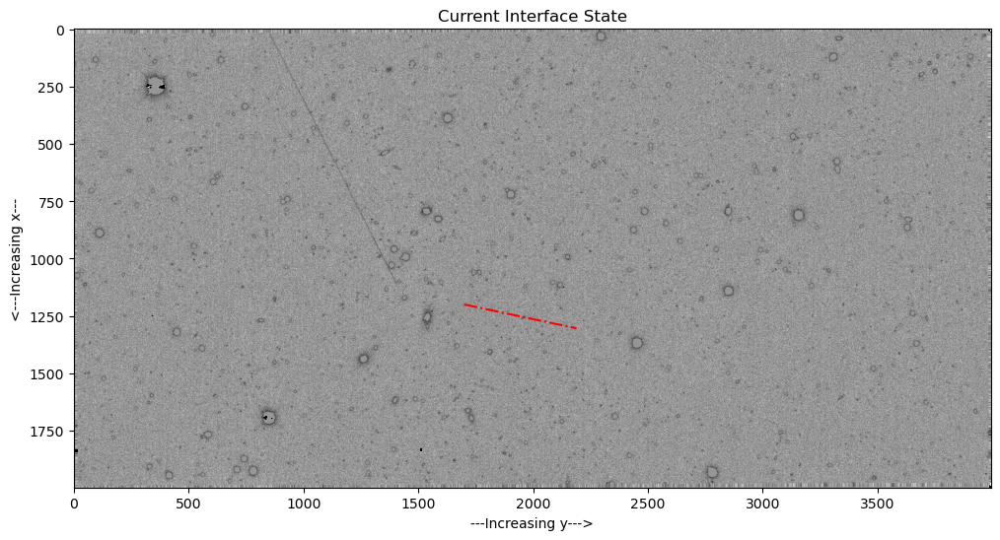

In [9]:
streak1.x1 = 1200; streak1.y1 = 1700; streak1.theta = np.deg2rad(12); streak1.IS_rad = 120 #W/m^2/Sr!
streak1.L = 500 #pixels! (leaving everything else as default)

streak1.pilot()

Looks good! Let's add this to the simulation with .add(). This takes a second:

In [10]:
streak1.add()

NADIR angle: 41.43 degrees
Streak total magnitude: 18.513
CPUL: 28.238
CALCULATED MAGZERO WITH PERFECT FITTING: 28.88802
Required streakmodel sizescale: 1024
raw counts = 14119
counts with noise = 14024
Streak added successfully


This tells you some things. The NADIR angle is the angle between 'straight down' for the satellite and our position of observation, CPUL is the number of Counts Per Unit Length of the streak (in per-pixel; if this value is comparable to your image noise you should not expect to see the streak clearly), and we see what the total number of counts before and after addition of realistic noise is like. We can now display the image to see the streak:

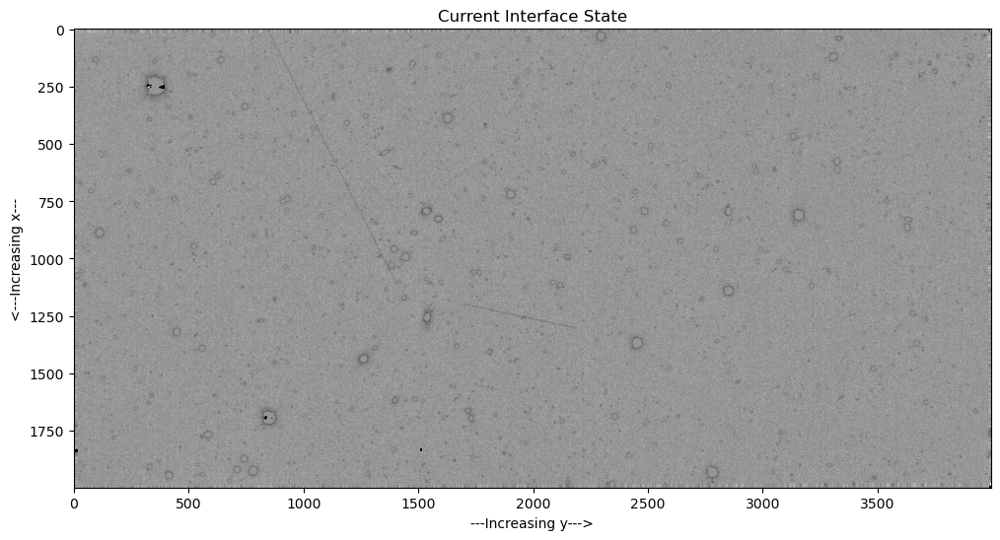

In [11]:
Tut_sim.VM = 30
Tut_sim.display()

And there it is! New, simulated streak. Notice that even though I set this to be from a source about 6 times more intense than ORCASat, it's still pretty dim.

Here I'm going to initialize 2 more streaks with different parameters, and add them to the image using each one's .add() method. After that, I'll display the results.

In [12]:
streak2 = sim_streak(Tut_sim) #Intialize the streaks
streak3 = sim_streak(Tut_sim)

streak2.x1 = 700; streak2.y1 = 1700; streak2.theta = np.deg2rad(5); streak2.IS_rad = 300 #W/m^2/Sr!
streak2.L = 1600 #pixels! (leaving everything else as default)

streak3.x1 = 200; streak3.y1 = 3500; streak3.theta = np.deg2rad(72); streak3.IS_rad = 500 #W/m^2/Sr!
streak3.L = 600 #pixels! (leaving everything else as default)

streak2.add()
streak3.add() ### Adding them to our image

NADIR angle: 41.43 degrees
Streak total magnitude: 17.519
CPUL: 22.061
Required streakmodel sizescale: 2048
raw counts = 35298
counts with noise = 35198
Streak added successfully
NADIR angle: 41.43 degrees
Streak total magnitude: 16.964
CPUL: 98.050
Required streakmodel sizescale: 1024
raw counts = 58829
counts with noise = 58985
Streak added successfully


That took me about 5s to run. Let's have a look at the new image:

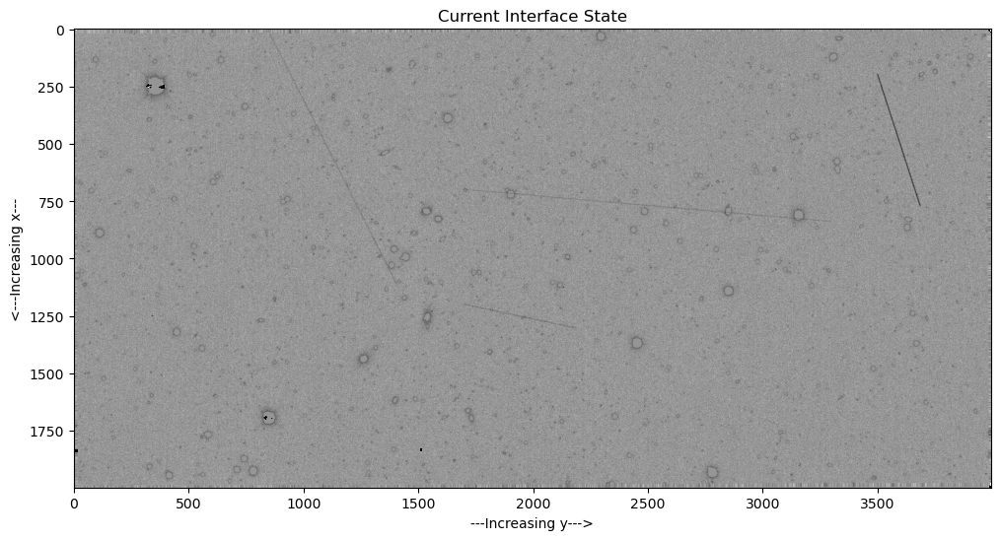

In [13]:
Tut_sim.display()

Great! Now, what if I wanted to remove a streak? Well, each one has a .remove() method. Let's try this on streak1:

In [14]:
streak1.remove()

Streak removed successfully


Check that it's gone:

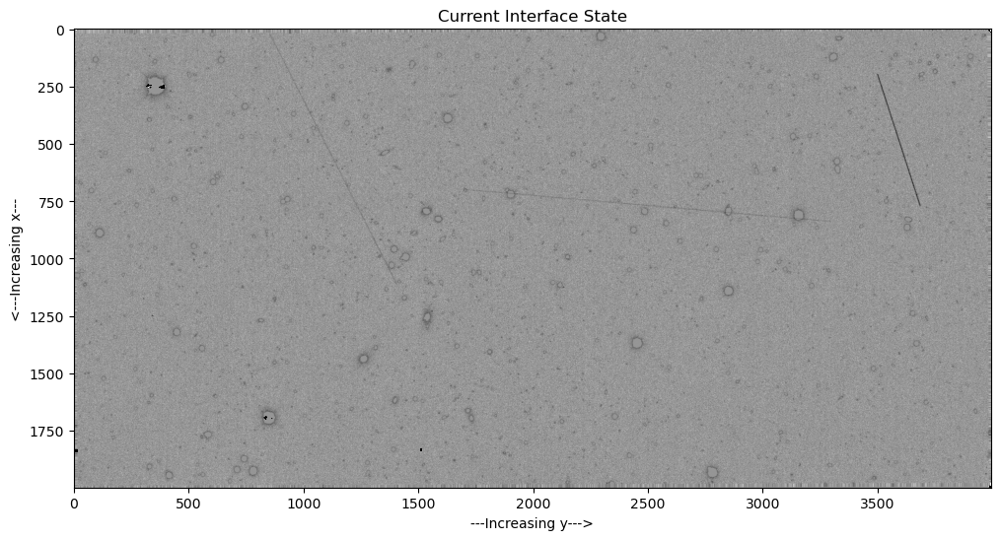

In [15]:
Tut_sim.display()

Yep, no more streak1! If I wanted to re-add the streak, it doesn't need the few seconds to add it back in; the streak is saved and doesn't need to be re-generated. If any parameters are changed, the streak needs to be re-generated, however. 

Finally, we can clear all streaks from the image using the .clear_streaks() method of the simulation instance. Let's do that now:

In [16]:
Tut_sim.clear_streaks()

Streaks removed


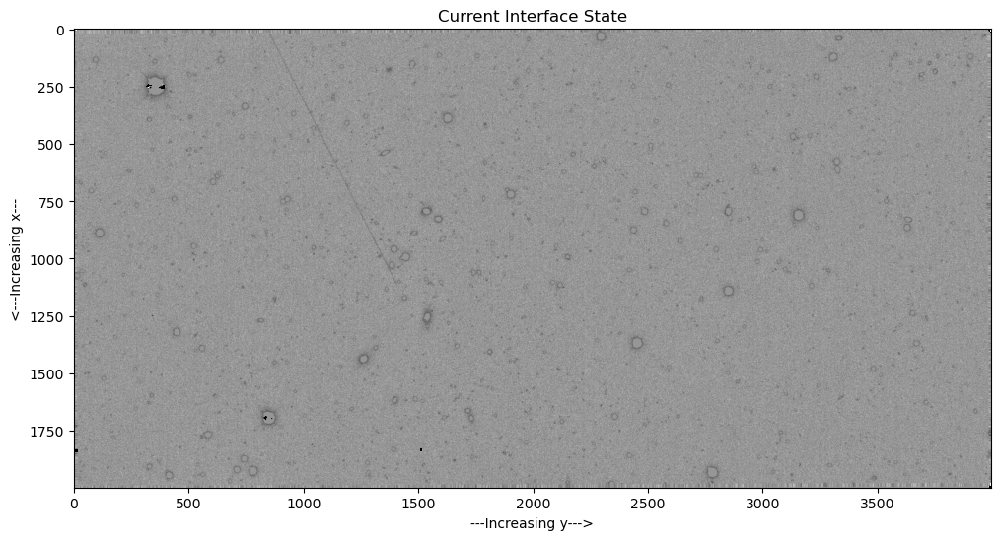

In [17]:
Tut_sim.display()

Presto, no more simulated streaks!

# Pill Aperture Photometry

Now, down to business. Let's add streak1 back in, and do some photometry on it.

In [19]:
streak1.add()

Streak total magnitude: 18.513
CPUL: 28.238
Counts before noise: 14119
Counts with noise: 14335
Streak added successfully


For pill aperture photometry, I've written a method called simpill() for the simulations. simpill() has a slightly more
complicated calling signature but will otherwise do virtually all of the work for us. The parameters, in order, are:

~ xc & yc; the x and y centres of the pill (with x and y again being measured from the top left, sorry!)

~ r; The radius of curvature of the pill caps. The central area has a width of twice this value

~ L; The length of the pill, in pixels

~ angle; the angle the pill makes, measured clockwise from horizontal

~ streak; finally, we pass the name of the streak to be measured, so that we can make computations with known streak source parameters

Notice that most of these are parameters we already have! For the centre of the pill, each streak instance also has 2 secret parameters created after it was added the first time, called cheatx and cheaty, which give the centre of the streak (since we previously specified the beginning). We can then, very easily, put the pill in the right place with the following arguements:

15574 points in pill aperture
Total Flux: 18124 +- 809
Calculated Magnitude Zeropoint: 29.1591 +- 0.0485
True Zeropoint: 28.8880


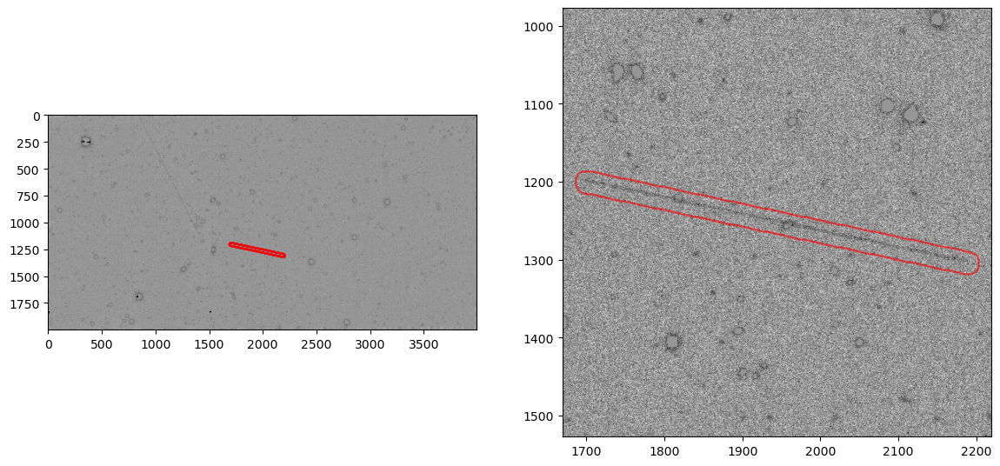

In [21]:
Tut_sim.simpill(xc = streak1.cheatx,
                yc = streak1.cheaty, 
                r = 4*Tut_sim.fwhm, 
                L = streak1.L,
                angle = streak1.theta, 
                streak = streak1)

Simpill sums up all of the pixel counts in this area, and uses our knowledge of the light source and observation specifics to calculate what the magnitude zero point must be, since we know the flux zero point and the theoretical brightness of the streak. Notice that we calculated a zeropoint which is too high and more than can be explained by my low-ball error, which only accounts for poisson noise. The reason for this is that there is still a significant excess of flux present in the field after source removal. This is where a comparison image comes in, the idea being that we use the same pill, in the same place, in a different image without the streak to see if we can remove more of this flux excess. I'll use the 052344 source-subtracted image, and re-run all of what we just did in one cell:

In [20]:
Tut_sim2 = streak_interface('052244_OBJSUB.fits', 41, comparim = '052344_OBJSUB.fits')
#                                                       ^
#                                              optional field specified

streak4 = sim_streak(Tut_sim2)
streak4.x1 = 1200; streak4.y1 = 1700; streak4.theta = np.deg2rad(30); streak4.IS_rad = 100 #W/m^2/Sr!
streak4.L = 780 #pixels! (leaving everything else as default)

streak4.add()

NADIR angle: 41.43 degrees
Streak total magnitude: 18.711
CPUL: 15.085
Required streakmodel sizescale: 1024
raw counts = 11765
counts with noise = 11699
Streak added successfully


17799 points in pill aperture
Total Flux: 14741 +- 862
Calculated Magnitude Zeropoint: 29.1328 +- 0.0635
Calculated Zeropoint with comparison subtracted: 28.8253
True Zeropoint: 28.8880


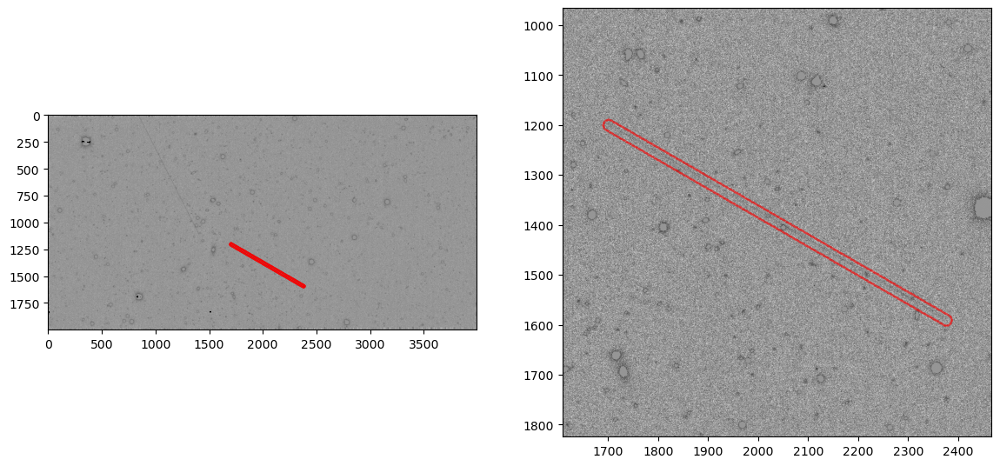

In [21]:
Tut_sim2.simpill(xc = streak4.cheatx,
                yc = streak4.cheaty, 
                r = 3*Tut_sim.fwhm, 
                L = streak4.L,
                angle = streak4.theta, 
                streak = streak4)

Now we get a new field in the output, which has done this comparison to try to reach a better estimate of the magnitude zeropoint. This is much better, but there's clearly still unquantified error here. This error, and the accuracy of the retrieval of the zeropoint as a whole, are what we want to quantify and analyze, and ideally perfect! 

# Different PSFs

The point-spread-function (PSF) of a simulation can be set. If the parameter '.psf' is set to a scalar value, the simulation will create a streak with a Gaussian point spread funciton, and the .psf parameter is the sigma value for the Gaussian. If .psf is NOT a scalar value but is instead set to a 2d array, then the streak addition method will now treat that array as the point spread function for the image. This PSF need not be normalized, since streak normalization happens after (but before noise addition). I'll demonstrate this with a particularly happy and unusual point spread function:

In [22]:
testpsf = np.zeros((13,13))

testpsf[3][3] = 1
testpsf[3][4] = 1
testpsf[4][3] = 1
testpsf[4][4] = 1

testpsf[3][9] = 1
testpsf[3][8] = 1
testpsf[4][9] = 1
testpsf[4][8] = 1

testpsf[8][2] = 1
testpsf[8][3] = 1
testpsf[9][3] = 1
testpsf[9][4] = 1
testpsf[9][5] = 1
testpsf[9][6] = 1
testpsf[9][7] = 1
testpsf[9][8] = 1
testpsf[9][9] = 1
testpsf[8][9] = 1
testpsf[8][10] = 1

## Notice that this doesn't have to be normalized

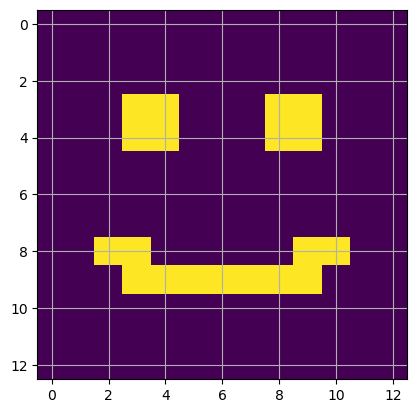

In [23]:
plt.imshow(testpsf)
plt.grid()

Generate a simulation and a streak to use this psf for:

In [24]:
psf_test_sim = streak_interface('052244_OBJSUB.fits', 41)

In [25]:
psf_test_sim.psf = testpsf # <---- setting the simulation psf to the array displayed above!

In [26]:
funnystreak = sim_streak(psf_test_sim)

In [27]:
funnystreak.IS_rad = 400

In [28]:
funnystreak.theta = np.deg2rad(45)

In [29]:
funnystreak.L = 600

In [30]:
funnystreak.add()

NADIR angle: 41.43 degrees
Streak total magnitude: 17.206
CPUL: 78.440
Required streakmodel sizescale: 1024
raw counts = 47063
counts with noise = 46695
Streak added successfully


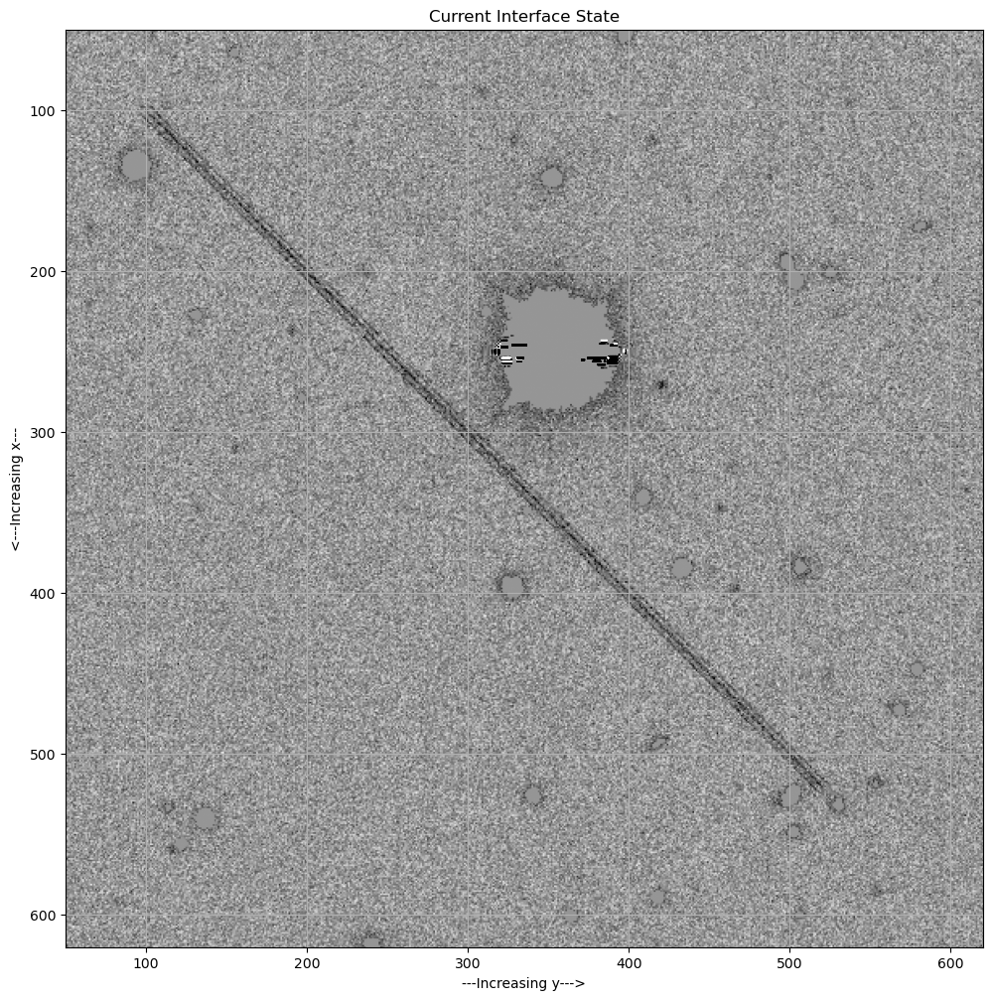

In [31]:
psf_test_sim.display()
plt.xlim(50,620)
plt.ylim(620,50)
plt.grid()

It may not be totally obvious, but this is a drawn out smiley face! Let's do some pill photometry on it to demonstrate that the counts are still being done correctly:

9957 points in pill aperture
Total Flux: 49428 +- 676
Calculated Magnitude Zeropoint: 28.9413 +- 0.0149
True Zeropoint: 28.8880


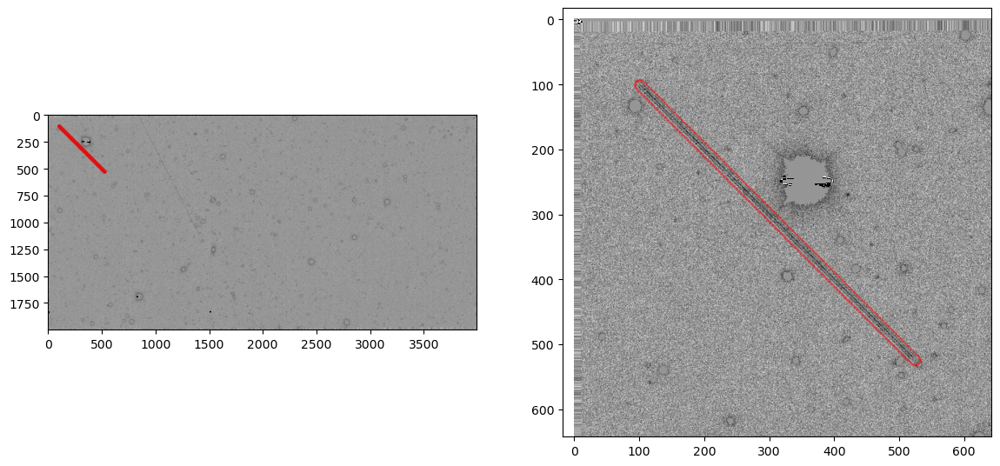

In [32]:
psf_test_sim.simpill(xc = funnystreak.cheatx,
                yc = funnystreak.cheaty, 
                r = 8, 
                L = funnystreak.L,
                angle = funnystreak.theta, 
                streak = funnystreak)

# TRIPPy PSF fitting

Of course, to simulate streaks it is desirable to use the PSF of the observation itself. To do this, I've implemented the option to use a modified version of TRIPPy's source extractor based psf fitting to generate a moffat profile PSF using identified point sources. It is simple to use this, we just need to call the method gen_trippy_psf. This has several arguements:

baseim: The directory in which to find the image to calculate the PSF from (note that this of course cannot be source subtracted!)

config: The source extractor config file to use

catname: The source extractor catalog name to write to

param_file: The source_extractor parameter file to use when making the catalog

scale: The sidelength of the psf to be generated. THIS MUST BE AN ODD VALUE! 

I'll call it here:

In [33]:
Tut_sim.gen_trippy_psf(baseim = 'Proc/052244/230131_052244_opi_r_v1.fits.fz',
                       config = 'conf_052244_pre.sex',
                       catname = 'test.cat',
                       param_file = 'pre.param',
                       scale = 25)

SAVEDPSF = Tut_sim.psf # <--- These will be used to store the psf so we don't need to generate it every time we restart the sim!
Tut_sim.psf = SAVEDPSF

Fitting stars with moffat profiles...
      X         Y    chi    a     b    FWHM
True


/home/jgoodeve/anaconda3/lib/python3.9/site-packages/trippy/bgFinder.py:149: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode = stats.mode(y)[0]
/home/jgoodeve/anaconda3/lib/python3.9/site-packages/trippy/bgFinder.py:151: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warni

    2295.84    34.80 0.30  4.26  3.76  3.83 
True
True


/home/jgoodeve/anaconda3/lib/python3.9/site-packages/trippy/bgFinder.py:184: RuntimeWarning: invalid value encountered in double_scalars
  if (s / g**0.5) > gaussStdLimit or forceBackupMode:


    1043.21    89.52 0.77  3.99  3.32  3.85 
True
    3904.48   121.48 0.31  4.08  3.87  3.62 
True
    1591.19   115.99 0.84  4.51  4.10  3.88 
True
     641.67   137.47 0.27  4.16  3.64  3.81 
True
    1757.44   120.08 0.54  4.02  3.45  3.80 
True
      94.92   135.36 0.27  3.98  3.48  3.74 
True
    1166.97   165.06 0.62  3.88  3.30  3.76 
True
    1979.14   183.21 0.32  3.40  2.73  3.66 
True
    3233.42   208.52 0.25  3.75  3.43  3.56 
True
    2589.15   246.51 0.49  4.15  3.83  3.70 
True
    2435.49   251.50 0.72  4.11  3.85  3.66 
True
    3375.06   263.51 1.01  4.27  4.21  3.62 
True
     746.06   339.27 0.27  4.21  3.70  3.83 
True
    2005.02   337.80 1.83  4.70  4.59  3.80 
True
    1628.87   390.46 2.78  6.05  6.16  4.18 
True
     957.24   371.77 0.28  3.81  3.26  3.72 
True
    1271.44   382.73 0.61  4.20  3.78  3.77 
True
    2536.15   403.98 0.89  4.34  4.14  3.71 
True
    1188.98   411.91 0.41  4.14  3.66  3.79 
True
    3132.37   469.78 0.22  3.97  3.61  3.66 
True


/home/jgoodeve/anaconda3/lib/python3.9/site-packages/scipy/optimize/_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 250.
  warnings.warn(errors[info][0], RuntimeWarning)


    1512.41  1833.84 22.57  4.57  68.10  0.93 
True
    2356.62  1688.31 0.21  3.85  3.43  3.65 
True
    3711.54  1626.94 0.33  3.76  3.52  3.51 
True
    1486.95  1612.10 0.60  3.93  3.52  3.67 
True
    1278.74  1888.92 0.99  4.38  4.08  3.78 
True
    1392.24  1831.60 0.67  4.34  3.94  3.81 
True
     330.22  1906.26 0.40  4.14  3.74  3.74 
True
     129.68  1522.76 0.64  4.15  3.79  3.72 
True
     267.71  1481.66 1.38  4.53  4.37  3.76 
True
    3482.48  1479.79 0.72  4.06  3.81  3.63 
True
     710.57  1919.75 0.20  3.98  3.48  3.74 
True
     558.56  1391.45 0.20  3.85  3.35  3.70 
True
     448.83  1321.45 0.20  4.06  3.55  3.78 
True
    3669.79  1370.77 0.24  3.92  3.67  3.58 
True
    1599.98  1103.82 0.54  3.98  3.50  3.74 
True
    2419.59  1857.35 0.22  3.54  3.04  3.59 
True
    3653.45  1239.22 0.22  3.78  3.51  3.54 
True
    3213.49  1119.56 0.30  3.99  3.66  3.65 
True
    2419.65  1049.70 0.86  4.14  4.00  3.61 
True
    2086.69  1104.58 1.19  4.34  4.07  3.74 
Tru

/home/jgoodeve/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/jgoodeve/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/jgoodeve/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/jgoodeve/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/home/jgoodeve/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/jgoodeve/anaconda3/lib/python3.9/site-packages/trippy/psf.py:944: Runt

Full width at half maximum 3.720 (in pix).


The warnings you will likely see running this are from Trippy; don't worry, it's worked! We can check to see what our psf now looks like:
plt.imshow(Tut_sim.psf)

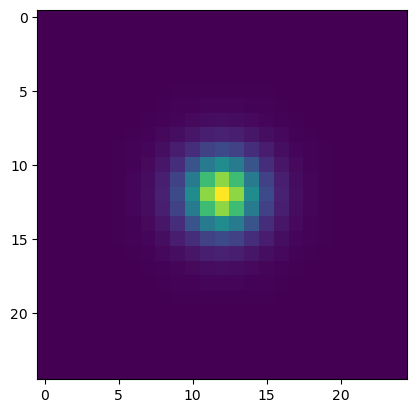

In [34]:
plt.imshow(Tut_sim.psf)

# Markov Chain Monte-Carlo (MCMC) Trailed PSF fitting

Ok, it's time to bring out the big guns. With the PSF of an image as a known, a streak is specified by 6 parameters; its
xy position, its amplitude (total flux), the angle it makes through the image, and a free-floating background intensity parameter
which accounts for the fact that background subtraction may be imperfect. If we want to curve-fit this model to a streak, we need to be
clever. Usual least-squares/chi-squared minimization algorithms will struggle here and take a long time, and anything gradient-descent
based will likely fail since the 6D parameter space is likely full of local chi-squared minima (whereas we'd be looking for a global min).
The answer here is to use an MCMC method to move a set of 'walkers' around in the parameter space, which will, if set up correctly, distribute themselves according to the 'posterior distribution' - for our purposes, this is effectively the probability mass function $e^{-\frac{\chi^2}{2}}$
where $\chi^2$ is a function of our input parameters. We use this here to find the most likely parameters for our streak and effectively quantify their uncertainty, based on the distribution of walkers through time allowed to evolve for many steps. 

Let's set up a streak to perform our MCMC fitting on. I'm going to make it a small one, since this process will be computationally intense.
Generating models to calculate $\chi^2$ involves FFT-based convolution, the completion time of which scales as N*log(N), where N is the image size.

In [ ]:
Tut_sim.clear_streaks()

streak1 = sim_streak(Tut_sim)

streak1.x1 = 200
streak1.y1 = 2130
streak1.theta = np.deg2rad(80)
streak1.L = 413
streak1.IS_rad = 80
streak1.delta_t = 0.15

streak1.add()

Streaks removed
NADIR angle: 41.43 degrees
Streak total magnitude: 18.954
CPUL: 22.791
Required streakmodel sizescale: 512
raw counts = 9412
counts with noise = 9397


Take a quick peek at our streak:

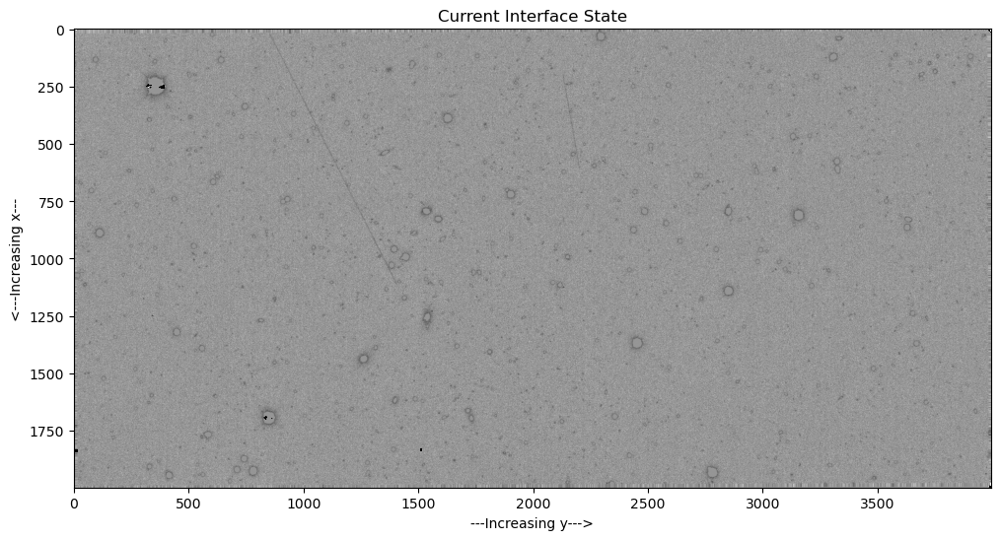

In [38]:
Tut_sim.display()

There is is; nice and short but reasonably bright. Let's use the section method of the simulation, with the streak as an arguement,
to generate a small section of our image centered on the streak:

In [54]:
print(f)
print(np.mean(im))

38.440000000000005
38.4006875


477.3 142.3
Section created (called .sect())


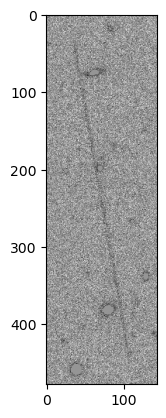

In [48]:
Tut_sim.section(streak1)

In [ ]:
This section is made with only a small margin around the streak to minimize computation time. Now, we are ready to do the MCMC fitting. Here are the arguements to the streak_interface method 'emcee_fit', in order:

streak: The first arguement is the streak which the fitting is being done on. This is specified for zeropoint computation post-fitting

section: The second arguement is the section to use. This will pretty much always be (your simulation name).sect(), where you have just created sect

psf: The psf to be used for fitting. This will almost always be (your simulation name).psf

bestguess: Your initial guess for the parameters of the streak, as a tuple. Order is (x,y,flux,length,angle,background) <-- background is optional! See 'fixed_b' optional param. below

bounds: The spread of the initial walker positions (uniform), and also demarkation of the allowed walker bounds. Also a tuple of 5-6 values (depending on if fixed_b is specified), with the same 4
        reference order as bestguess. For example, if I specify x = 22 in bestguess, and then I have the first entry in bounds be 5, then the x values for the walkers will be generated
        uniformly in the range (17,27), and walkers will not be allowed outside this range of x values (as in, 22 $\pm$ 5). Tighter is better but be careful with the bounds; walkers that are initialized with large
        chi^2 values are very unlikely to have candidate steps accepted and will converge to the posterior distribution much slower than those
        initialized with a reasonable guess
        
basenoise: The 1 sigma noise in the image background. 6.4 by default, as in all of our Jan images (approximate)

nwalk: This is the number of walkers to use. More walkers is generally a good idea; they use information from eachother to figure out where
        to go next, and convergence to correct parameters will be easier with more. This value must be at least 2x the number of dimensions
        in the parameter space, or emcee will get mad! 
        
nburn: The number of initial steps to reject during the burn-in process (these are excluded from statistics at the end). This should be equal to
        or greater than the number of steps it takes for the walker distribution to converge to the posterior distribution. In my testing
        this was satisfied for nburn > 200-300 for good initial guesses.
        
niter: The number of steps after nburn that the walkers will take, which will be used for statistics at the end. Larger numbers mean more time, but
        better statistics!
        
Finally, there are some additional parameters: 

walkerreport: optional boolean parameter, which is False by default. If set to true, the initial walker positions will be printed.

chilimit: If given, this is the (pixel) distance beyond which the chi-squared contribution is taken to be zero. This prevents large structure in the section but not associated with the streak from influencing
            calculations and being seen as a fitting target (default None; uses whole image)
            
fixed_b: If given, this fixes the background value. If good background subtraction has been done previously, advise setting this to your best estimate of the background (even small values can be important!)

Let's do an emcee fit for streak1, using initial guesses very close to (or identical to) the known streak parameters, with small but nonzero spread (expressed in the bounds input). We'll use 50 walkers, with a burn-in of 200 steps, and 400 steps to do statistics on:

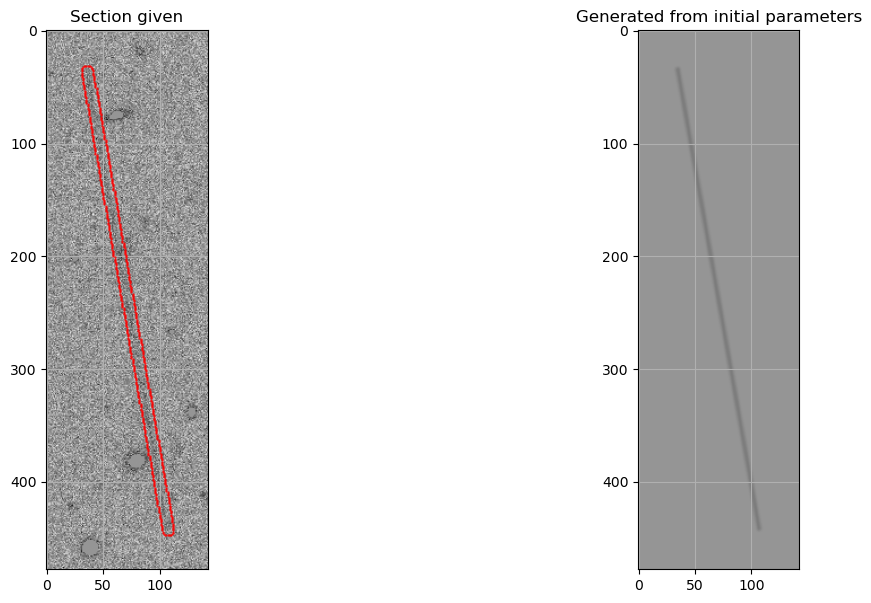

Executing burn-in... this may take a while.


100%|█████████████████████████████████████████████████████████████████████████████████| 200/200 [02:04<00:00,  1.61it/s]


Burn in complete. Elapsed time: 125.1s                                                             
Executing production run... this will also take a while.


100%|█████████████████████████████████████████████████████████████████████████████████| 400/400 [03:16<00:00,  2.03it/s]


Production Complete. Elapsed time: 197.5s                                                           
Complete!


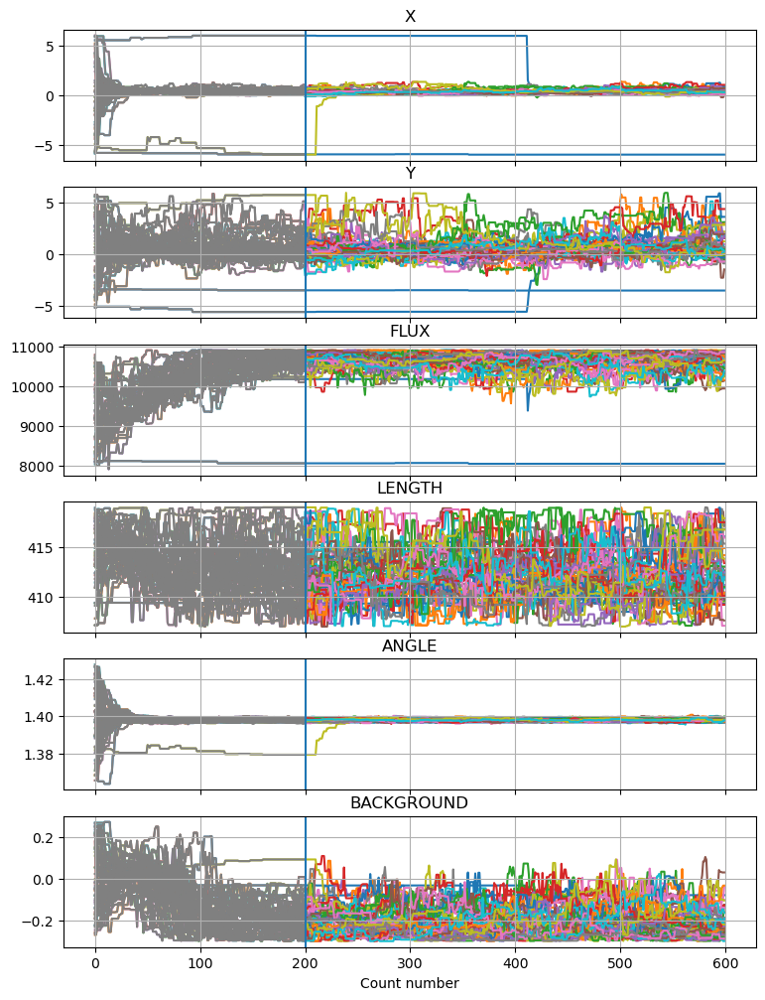

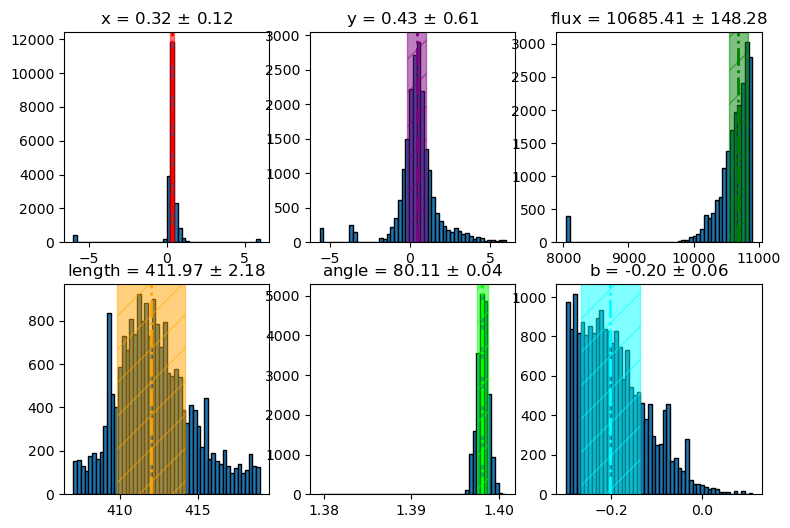

Calculated Magnitude Zeropoint: 29.0257
Lower bound Zeropoint Error: 0.0151
True Zeropoint: 28.8880


In [40]:
Tut_sim.emcee_fit(streak1,Tut_sim.sect,Tut_sim.psf,
                  (0,0,9400,streak1.L,streak1.theta,0),
                    (6,6,1500,6,np.deg2rad(2),0.3),
                  basenoise = 6.2,nwalk = 50,nburn = 200,niter = 400,
                 chilimit = 1.5*Tut_sim.fwhm)

And there we go! The MCMC algorithm did an excellent job of nailing down the parameters here, and gave us a very accurate magnitude zeropoint, even with this not particularly long or bright streak. Shown above are histograms of the distribution of walker positions in the parameter space through the post burn evolution. Lines indicate sigma-clipped means, and the shaded, hatched regions show the 1 sigma width. To demonstrate how this can fail or provide less fantastic results, let's intentionally give MCMC some less accurate initial parameters and wider bounds:

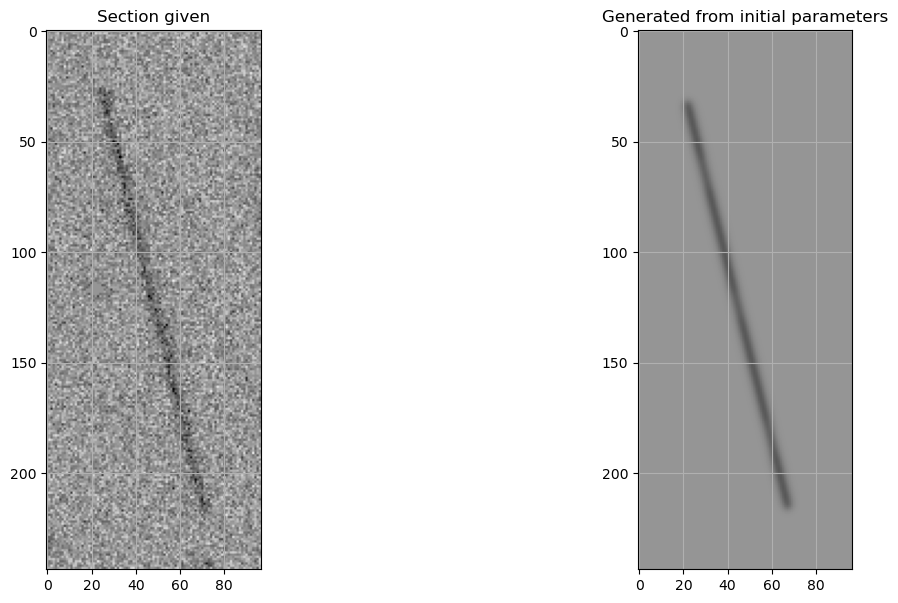

Executing burn-in... this may take a while.


/home/jgoodeve/anaconda3/ORCASat_Images/JG_Streaktools_Aug10.py:55: RuntimeWarning: invalid value encountered in true_divide
  TSF /= np.sum(TSF)


Burn in complete. Elapsed time: 65.6s                                                             
Executing production run... this will also take a while.
Production Complete. Elapsed time: 127.1s                                                           
Complete!


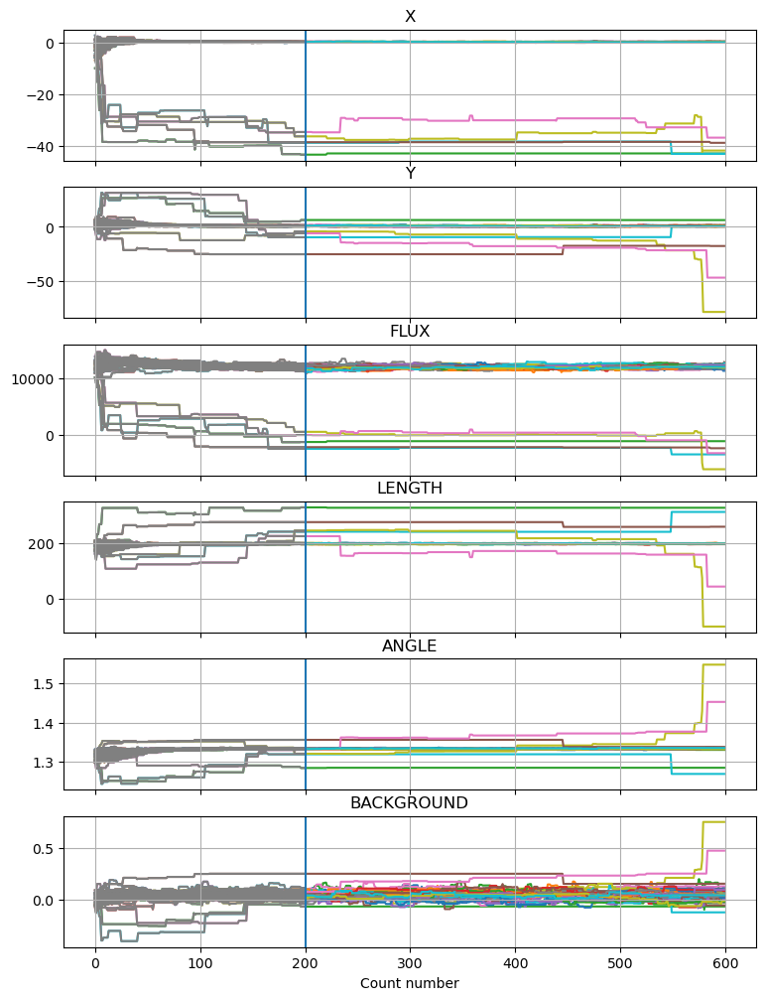

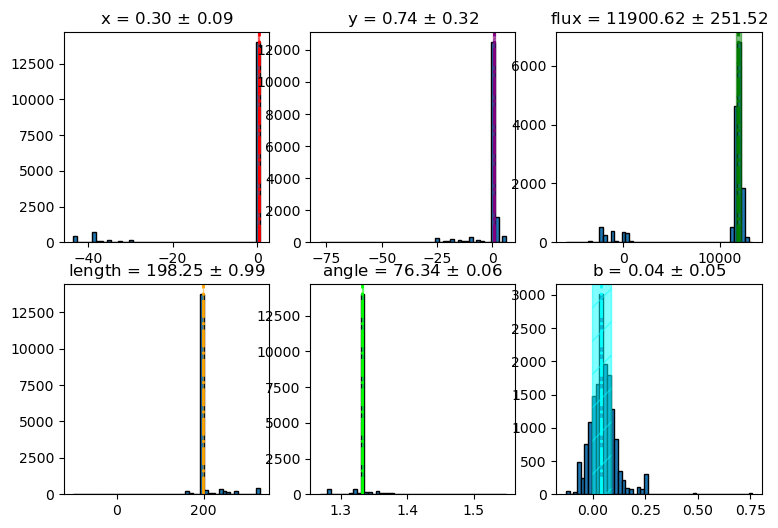

Calculated Magnitude Zeropoint: 28.9004
Lower bound Zeropoint Error: 0.0229
True Zeropoint: 28.8880


In [38]:
Tut_sim.emcee_fit(streak1,Tut_sim.sect,Tut_sim.psf,
                  (-2,3,9400,streak1.L-12,streak1.theta-np.deg2rad(1),0),
                  (10,10,4000,25,np.deg2rad(1.5),0.1),
                  basenoise = 6.4,nwalk = 40,nburn = 200,niter = 400)

Now, with these only slightly worse settings, we see that the algorithm does still find the right values thanks to sigma clipping and gives us an accurate zeropoint, but we see that at least some of the walkers ended up lost and unable to find the more likely region of possibilities in the parameter space. These walkers are unlikely to ever move much because every candidate position nearby to them is extremely unlikely to be accepted! This is why it is important to have strong initial guesses and as tight of an initial distribution as possible without overstating our confidence.

# Operating on Real Streaks

Of course, the goal with all of this is to be able to operate on real streaks and get good estimates of a magnitude zeropoint that way. We can do that here.

In [28]:
s1 = sim_streak(Tut_sim)

In [27]:
Tut_sim.clear_streaks()

Streaks removed


NADIR angle: 41.43 degrees
Streak total magnitude: 17.519
CPUL: 58.830
1024
raw counts = 35297
counts with noise = 35099
Streak added successfully


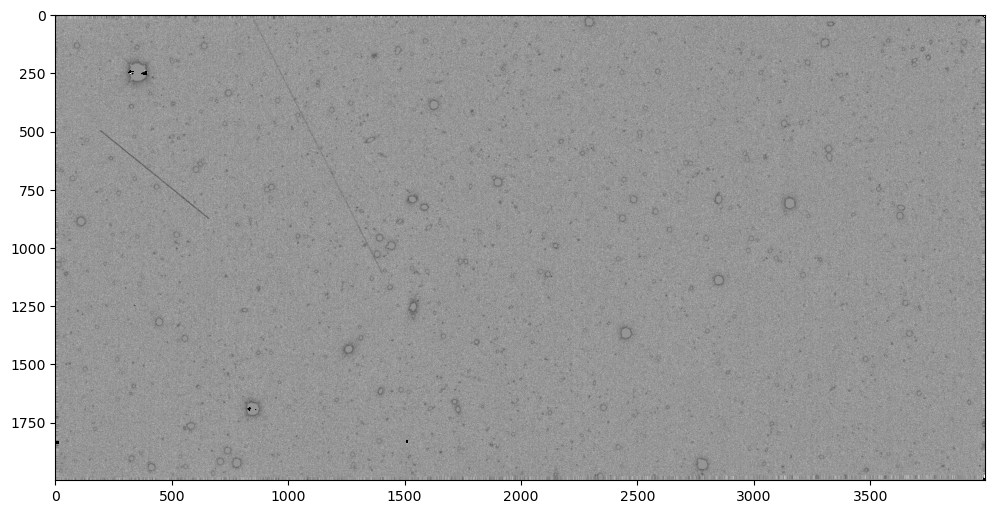

In [29]:
s1.x1 = 500
s1.y1 = 195
s1.L = 600
s1.theta = np.deg2rad(39)
s1.IS_rad = 300

s1.add()
Tut_sim.display()

Let's set up a `real_streak` instance:

In [30]:
s1.totalmag

17.518644780712613

In [31]:
r1 = real_streak(Tut_sim)

real streaks also have a method called 'pilot' - this time it lets you match up the length, angle and position of the streak before fitting:

dimensions: 467 x 556


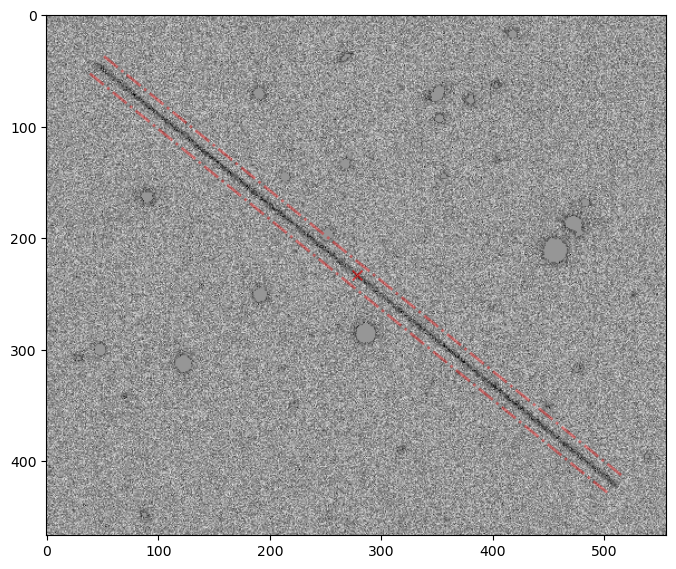

In [33]:
r1.x1 = 500
r1.y1 = 195
r1.L = 600
r1.theta = np.deg2rad(39)
r1.IS_rad = s1.IS_rad

r1.pilot()

As with simulated streaks, we can use '.section()' on real streaks:

467.0 556.0
Section created (called .sect())


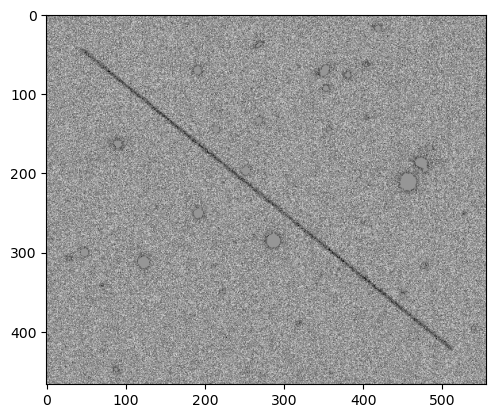

In [34]:
Tut_sim.section(r1)

In [35]:
r1.compute_magnitude(visout = True)

NADIR angle: 41.43 degrees
Computed magnitude: 17.5186


9103 points in pill aperture
Total Flux: 34379 +- 638
Calculated Magnitude Zeropoint: 28.8594 +- 0.0202
True Zeropoint: 28.8880


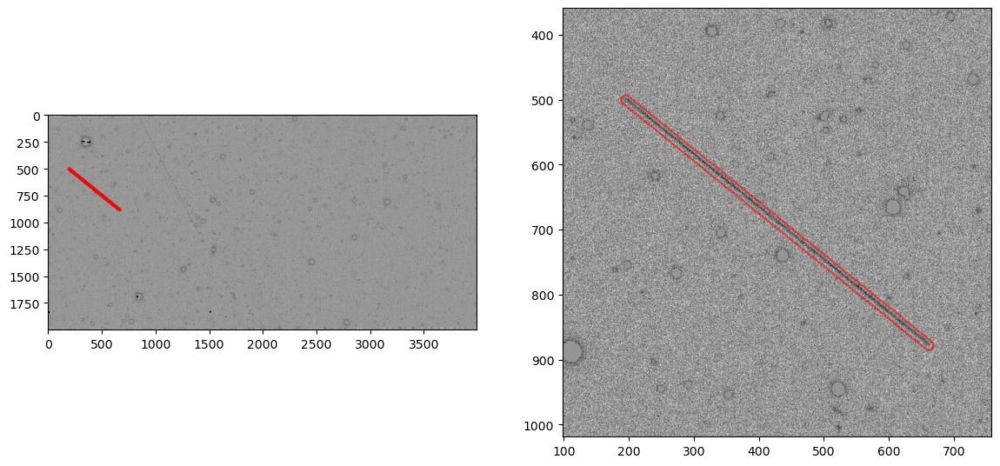

In [38]:
Tut_sim.simpill(r1.cheatx,r1.cheaty,2*Tut_sim.fwhm,600,np.deg2rad(39),r1)

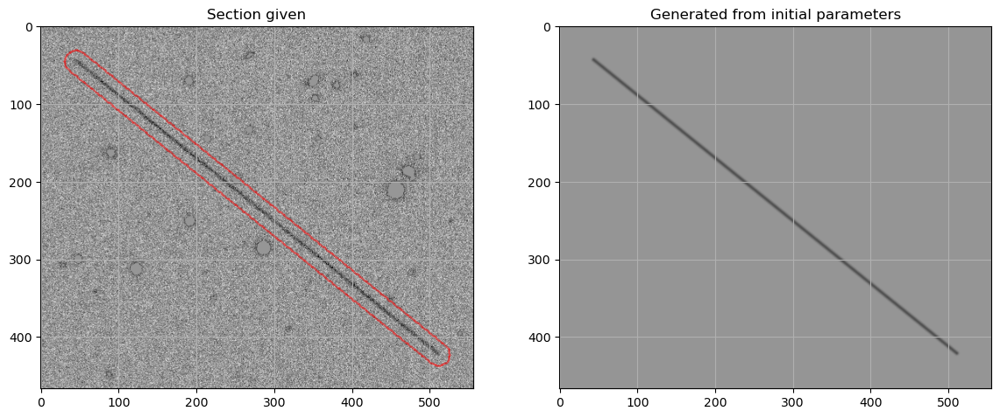

Executing burn-in... this may take a while.


100%|█████████████████████████████████████████████████████████████████████████████████| 150/150 [07:46<00:00,  3.11s/it]


Burn in complete. Elapsed time: 470.0s                                                             
Executing production run... this will also take a while.


100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [15:00<00:00,  3.00s/it]


Production Complete. Elapsed time: 903.5s                                                           
Complete!


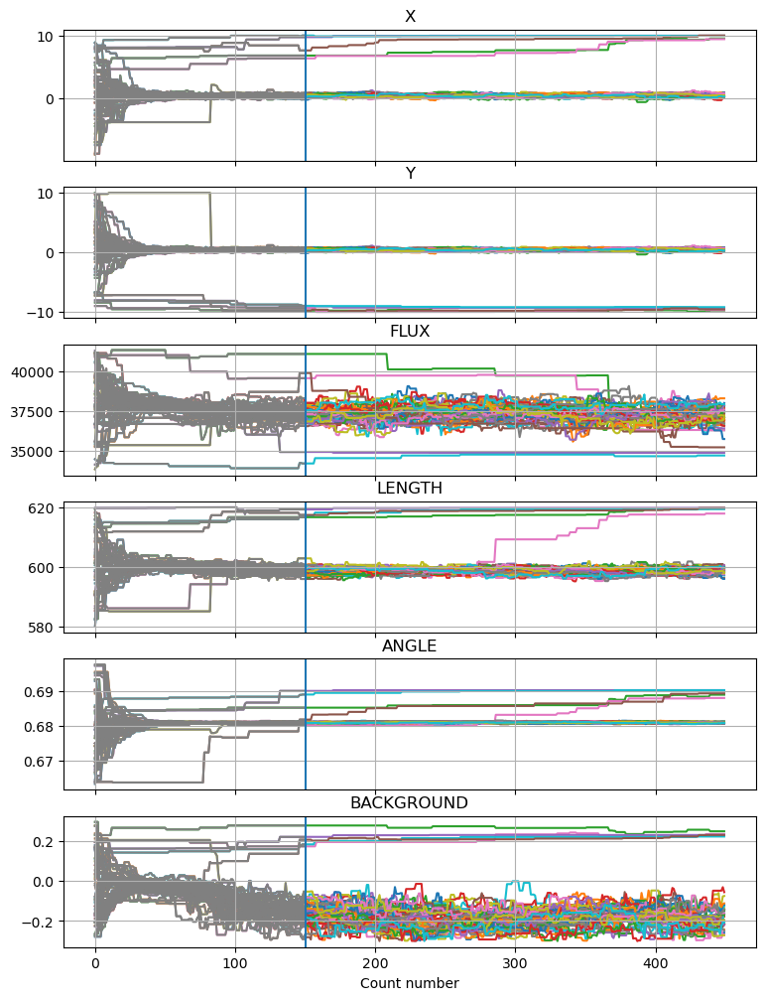

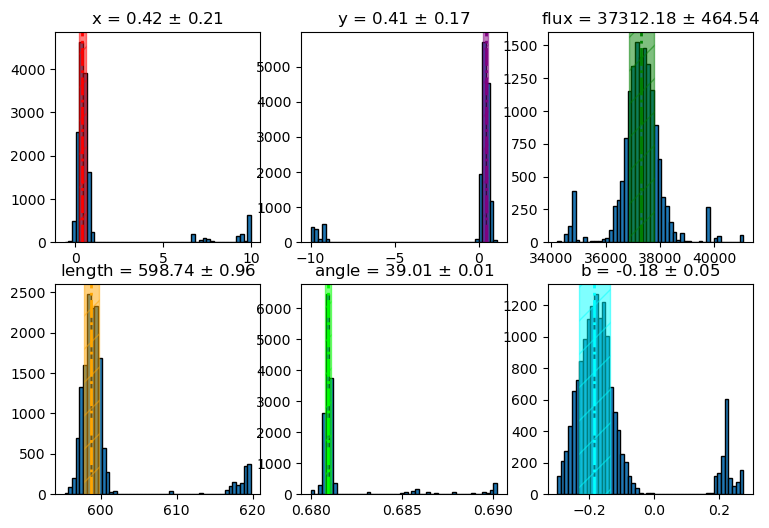

Calculated Magnitude Zeropoint: 28.9483
Lower bound Zeropoint Error: 0.0135
True Zeropoint: 28.8880


In [39]:
Tut_sim.emcee_fit(r1,Tut_sim.sect,Tut_sim.psf,
                  (0,0,37595,600,np.deg2rad(39),0),
                  (10,10,4000,20,np.deg2rad(1),0.3),
                  basenoise = 6.2,nwalk = 50,nburn = 150,niter = 300,chilimit = 4*Tut_sim.fwhm)

And that's most of it! Let me know if you have any questions :)